# <center> **Class Activation Mapping (CAM) and Weakly Supervised Object Localization for Car Detection** </center>


---



## **Abstract**
### This project explores the use of Class Activation Mapping (CAM) for weakly supervised object localization, with a focus on detecting the presence of cars in the Pascal VOC 2007 dataset. By transforming the original multi-label dataset into a binary classification task, where images are labeled as either containing a car or not, we simulate a weak supervision scenario in which only image-level labels are available. The core objective is to determine whether a convolutional neural network (ResNet18) can both accurately classify images and highlight the spatial regions most responsible for its predictions.

### To evaluate this, we train a ResNet18 model on the binary-labeled dataset and use CAM to generate heatmaps over correctly and incorrectly classified images. These maps allow for qualitative interpretation of the model's focus, and an approximation of the car's center using the most activated pixel. We also introduce controlled amounts of label noise into the training data to assess the robustness of the model and the impact on both prediction accuracy and spatial localization through CAM. This approach provides a practical and interpretable framework for understanding CNN decision-making in low-annotation settings and offers insights into model behavior under imperfect data conditions.



## **Introduction**
### With the growing demand for explainable AI, CAM has emerged as a technique that provides visual explanations for the decisions made by Convolutional Neural Networks (CNNs). CAM highlights the discriminative regions of an input image that most strongly influence the CNN’s prediction, making it a powerful tool for interpreting image-level decisions.

### The CAM technique was first introduced by Zhou et al. in their 2016 paper, "*Learning Deep Features for Discriminative Localization*" (Zhou et al., 2016). CAM is especially valuable when working with weakly labeled data, where only image-level annotations are available.


### To begin, we create the WeakPascalVOCDataset, which is done by modifying the VOCDetection dataset from the 2007 Pascal VOC dataset to create a weakly labeled binary classification task. Each image is assigned a binary label: 1 if a car is present, and 0 otherwise. This transforms the dataset into a form suitable for weak supervision. Below, we visualize a sample batch of images from the dataset to provide an overview of the input data.

Image batch shape: torch.Size([16, 3, 224, 224])
Weak labels (car present = 1): tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0])


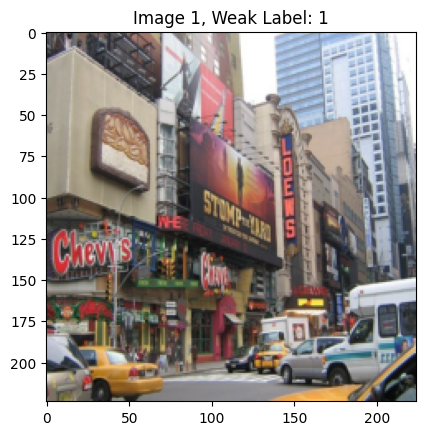

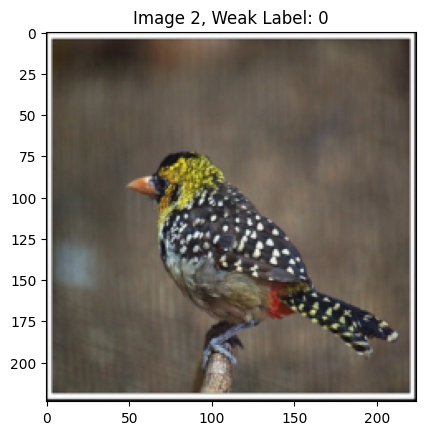

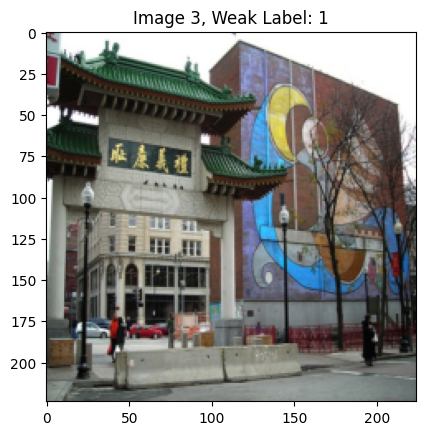

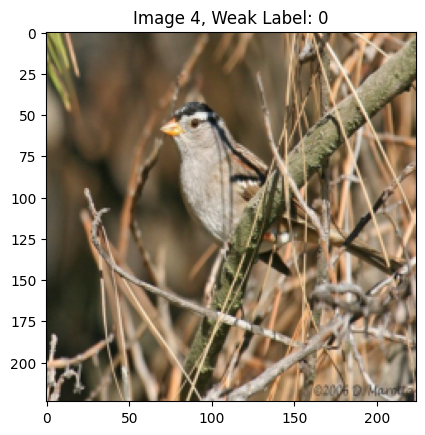

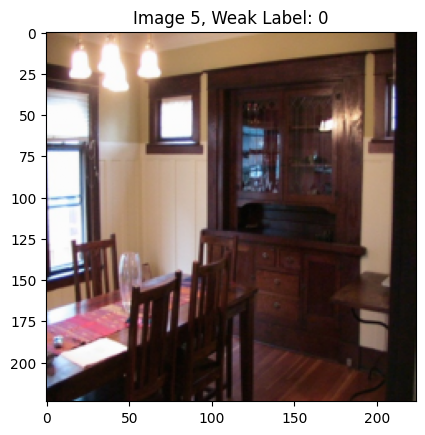

...

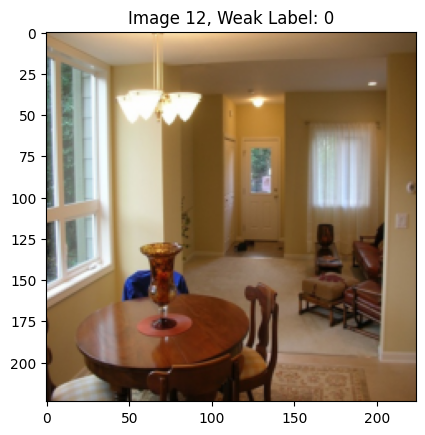

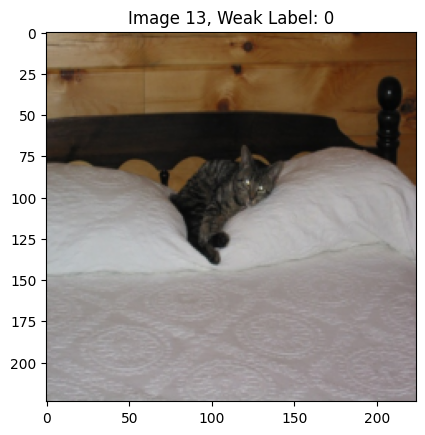

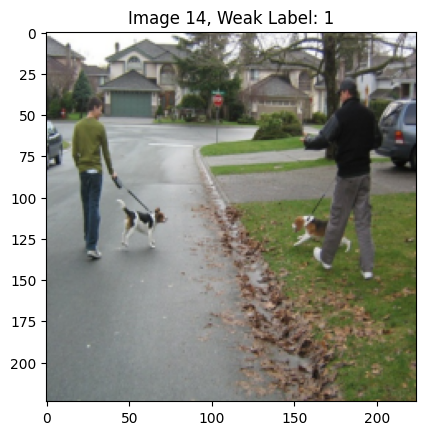

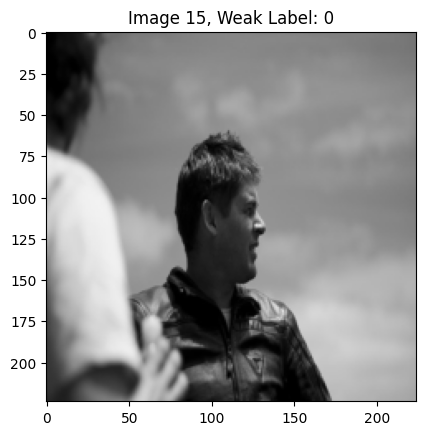

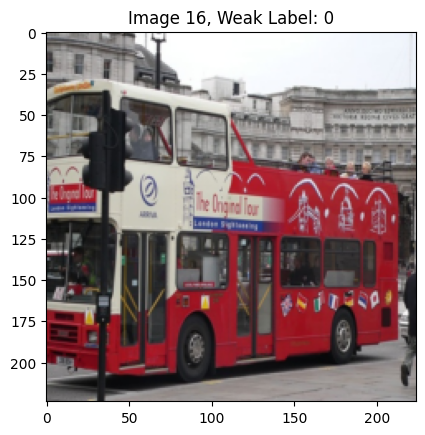

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
from torchvision.datasets import VOCDetection
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
default_year = '2007'
default_image_set = 'trainval'
TARGET_CLASS = 'car'

defaultTransform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

class WeakPascalVOCDataset(Dataset):
  def __init__(self, root, year='2007', image_set='trainval', target_class='car', transform=defaultTransform):
      self.voc = VOCDetection(root=root, year=year, image_set=image_set, download=True)
      self.transform = transform
      self.target_class = target_class

  def __len__(self):
      return len(self.voc)

  def __getitem__(self, idx):
      img, target = self.voc[idx]

      objects = target['annotation']['object']

      if isinstance(objects, dict):
          objects = [objects]

      label = 0
      #this goes through all image annotations until target_class is either found and label is set to 1 or if target_class is not found, then label remains set to 0
      for o in objects:
        if o['name'] == self.target_class:
          label = 1
          break

      img = self.transform(img)

      return img, label

# Sample output
root_dir = './data'
dataset = WeakPascalVOCDataset(root=root_dir, year=default_year, image_set=default_image_set, target_class=TARGET_CLASS, transform=defaultTransform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

for imgs, labels in dataloader:
  print(f"Image batch shape: {imgs.shape}")
  print(f"Weak labels (car present = 1): {labels}")
  for i, img in enumerate(imgs):
    img_np = img.numpy().transpose(1, 2, 0)
    plt.imshow(img_np)
    plt.title(f"Image {i+1}, Weak Label: {labels[i].item()}")
    plt.show()
  break

## **Data Distribution and Preprocessing**

### As can be seen below by the class distribution, the dataset is imbalanced, with around 5.5 times as many images without a car as there images containing a car.

In [9]:
label_counts = {0: 0, 1: 0}
for _, labels in dataloader:
  for label in labels:
    label_counts[label.item()] += 1
print(f"Class Distribution: {label_counts}")

Class Distribution: {0: 4250, 1: 761}


### To prepare the data, we create training and validation datasets with appropriate transformations. The training transformations include RandomHorizontalFlip, RandomRotation, and ColorJitter for data augmentation, improving the model's ability to generalize. Both training and validation datasets are also standardized with resizing, tensor conversion, and normalization to align with ResNet18's input requirements.

In [10]:
# Loading training and validation data
current_batch_size = 32
num_of_workers = 2

train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

validation_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

training_set =  WeakPascalVOCDataset(root=root_dir, year=default_year, image_set='train', target_class=TARGET_CLASS, transform=train_transform)
validation_set =  WeakPascalVOCDataset(root=root_dir, year=default_year, image_set='val', target_class=TARGET_CLASS, transform=validation_transform)

trainingloader = DataLoader(training_set, batch_size=current_batch_size, shuffle=True, num_workers=num_of_workers)
validationloader = DataLoader(validation_set, batch_size=current_batch_size, shuffle=False, num_workers=num_of_workers)

## **Model Setup and Training**
### We use the ResNet18 architecture for binary classification. The final fully connected layer is modified to output two logits corresponding to the binary labels. For optimization, we use Stochastic Gradient Descent (SGD) with empirically tuned hyperparameters: learning rate, momentum, and weight decay. Class imbalance is addressed using a weighted cross-entropy loss, assigning higher weight to the minority class (class 1). Through experimentation, the weight for the "car present" class was reduced from 5.5 to 1.5 to stabilize the validation loss.

In [11]:
# Setting parameters
num_epochs = 20
resnetModel = models.resnet18(pretrained=True)
resnetModel.fc = nn.Linear(512, 2)
resnetModel.to(device)

optimizer = optim.SGD(resnetModel.parameters(), lr=0.0001, momentum=0.9, weight_decay=0.01)
criterion = nn.CrossEntropyLoss(weight=torch.tensor([1.0, 1.5]).to(device))

### Now we create the training and validation loops for the model.

#### Note the code for the denormalize function below is by Joel Simon (code link found below in references).

-----------------------------------------------------------------------
       Epoch 1/20


100%|██████████| 79/79 [00:13<00:00,  6.03it/s]


Training Loss: 0.5252, Training Accuracy: 0.7837
Validation Loss: 0.3597, Validation Accuracy: 0.8976
-----------------------------------------------------------------------
       Epoch 2/20



100%|██████████| 79/79 [00:13<00:00,  5.96it/s]


Training Loss: 0.3566, Training Accuracy: 0.8932
Validation Loss: 0.2999, Validation Accuracy: 0.9187
-----------------------------------------------------------------------
       Epoch 3/20



100%|██████████| 79/79 [00:13<00:00,  5.91it/s]


Training Loss: 0.3000, Training Accuracy: 0.9144
Validation Loss: 0.2564, Validation Accuracy: 0.9275
-----------------------------------------------------------------------
       Epoch 4/20



100%|██████████| 79/79 [00:13<00:00,  6.05it/s]


Training Loss: 0.2877, Training Accuracy: 0.9124
Validation Loss: 0.2350, Validation Accuracy: 0.9279
-----------------------------------------------------------------------
       Epoch 5/20



100%|██████████| 79/79 [00:13<00:00,  5.95it/s]


Training Loss: 0.2669, Training Accuracy: 0.9132
Validation Loss: 0.2312, Validation Accuracy: 0.9243
-----------------------------------------------------------------------
       Epoch 6/20



100%|██████████| 79/79 [00:14<00:00,  5.49it/s]


Training Loss: 0.2573, Training Accuracy: 0.9176
Validation Loss: 0.2205, Validation Accuracy: 0.9271
-----------------------------------------------------------------------
       Epoch 7/20



100%|██████████| 79/79 [00:13<00:00,  5.91it/s]


Training Loss: 0.2450, Training Accuracy: 0.9244
Validation Loss: 0.2213, Validation Accuracy: 0.9243
-----------------------------------------------------------------------
       Epoch 8/20



100%|██████████| 79/79 [00:13<00:00,  5.97it/s]


Training Loss: 0.2355, Training Accuracy: 0.9248
Validation Loss: 0.2193, Validation Accuracy: 0.9231
-----------------------------------------------------------------------
       Epoch 9/20



100%|██████████| 79/79 [00:13<00:00,  6.01it/s]


Training Loss: 0.2280, Training Accuracy: 0.9260
Validation Loss: 0.2178, Validation Accuracy: 0.9231
-----------------------------------------------------------------------
       Epoch 10/20



100%|██████████| 79/79 [00:13<00:00,  5.73it/s]


Training Loss: 0.2221, Training Accuracy: 0.9320
Validation Loss: 0.2033, Validation Accuracy: 0.9323
-----------------------------------------------------------------------
       Epoch 11/20



100%|██████████| 79/79 [00:13<00:00,  6.05it/s]


Training Loss: 0.2136, Training Accuracy: 0.9304
Validation Loss: 0.2020, Validation Accuracy: 0.9303
-----------------------------------------------------------------------
       Epoch 12/20



100%|██████████| 79/79 [00:15<00:00,  5.00it/s]


Training Loss: 0.2077, Training Accuracy: 0.9328
Validation Loss: 0.1940, Validation Accuracy: 0.9363
-----------------------------------------------------------------------
       Epoch 13/20



100%|██████████| 79/79 [00:13<00:00,  5.94it/s]


Training Loss: 0.2057, Training Accuracy: 0.9344
Validation Loss: 0.1909, Validation Accuracy: 0.9359
-----------------------------------------------------------------------
       Epoch 14/20



100%|██████████| 79/79 [00:13<00:00,  5.89it/s]


Training Loss: 0.1901, Training Accuracy: 0.9348
Validation Loss: 0.1903, Validation Accuracy: 0.9351
-----------------------------------------------------------------------
       Epoch 15/20



100%|██████████| 79/79 [00:13<00:00,  5.97it/s]


Training Loss: 0.1983, Training Accuracy: 0.9344
Validation Loss: 0.1994, Validation Accuracy: 0.9303
-----------------------------------------------------------------------
       Epoch 16/20



100%|██████████| 79/79 [00:13<00:00,  5.87it/s]


Training Loss: 0.1788, Training Accuracy: 0.9432
Validation Loss: 0.1862, Validation Accuracy: 0.9363
-----------------------------------------------------------------------
       Epoch 17/20



100%|██████████| 79/79 [00:16<00:00,  4.91it/s]


Training Loss: 0.1891, Training Accuracy: 0.9416
Validation Loss: 0.1897, Validation Accuracy: 0.9327
-----------------------------------------------------------------------
       Epoch 18/20



100%|██████████| 79/79 [00:14<00:00,  5.55it/s]


Training Loss: 0.1987, Training Accuracy: 0.9396
Validation Loss: 0.1877, Validation Accuracy: 0.9363
-----------------------------------------------------------------------
       Epoch 19/20



100%|██████████| 79/79 [00:13<00:00,  5.94it/s]


Training Loss: 0.1776, Training Accuracy: 0.9452
Validation Loss: 0.1862, Validation Accuracy: 0.9351
-----------------------------------------------------------------------
       Epoch 20/20



100%|██████████| 79/79 [00:13<00:00,  5.90it/s]



Training Loss: 0.1804, Training Accuracy: 0.9392
Validation Loss: 0.1838, Validation Accuracy: 0.9382
-----------------------------------------------------------------------


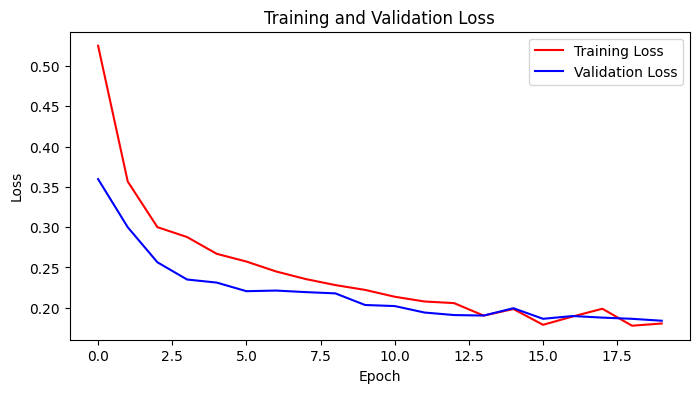

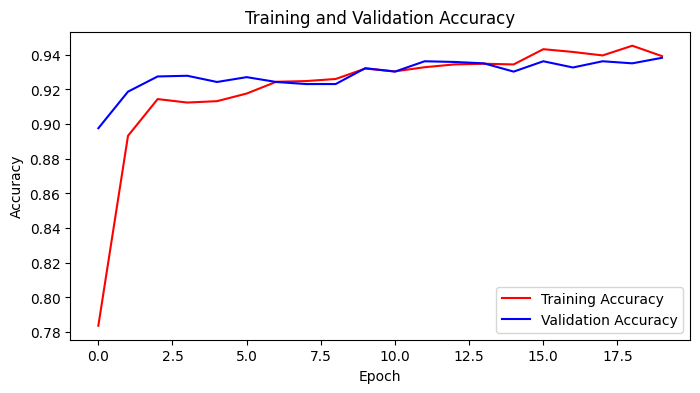

In [12]:
# Training model
training_loss = []
training_accuracy = []
validation_loss = []
validation_accuracy = []
true_labels = []
predicted_labels = []
correct_images = []
FP_images = []
FN_images = []

def denormalize(tensor, mean, std):
  tensor_copy = tensor.clone()
  for t, m, s in zip(tensor_copy, mean, std):
      t.mul_(s).add_(m)
  return tensor_copy

print("-----------------------------------------------------------------------")
for epoch in range(num_epochs):
  print(f"       Epoch {epoch+1}/{num_epochs}")

  #training loop
  resnetModel.train()
  current_training_loss = 0.0
  training_correct = 0
  training_total = 0
  for i, data in tqdm(enumerate(trainingloader), total=len(trainingloader)):
    training_total += 1
    img, labels = data
    img = img.to(device)
    labels = labels.to(device)
    optimizer.zero_grad()
    outputs = resnetModel(img)
    loss = criterion(outputs, labels)
    current_training_loss += loss.item()
    _, predictions = torch.max(outputs, 1)
    training_correct += (predictions == labels).sum().item()
    loss.backward()
    optimizer.step()
  epoch_training_loss =  current_training_loss/training_total
  epoch_training_accuracy = training_correct/len(training_set)
  training_loss.append(epoch_training_loss)
  training_accuracy.append(epoch_training_accuracy)

  #validation loop
  resnetModel.eval()
  current_validation_loss = 0.0
  validation_correct = 0
  validation_total = 0
  with torch.no_grad():
    for i, data in tqdm(enumerate(validationloader), total=len(validationloader)):
      validation_total += 1
      img, labels = data
      img = img.to(device)
      labels = labels.to(device)
      outputs = resnetModel(img)
      loss = criterion(outputs, labels)
      current_validation_loss += loss.item()
      _, predictions = torch.max(outputs, 1)
      validation_correct += (predictions == labels).sum().item()
      if epoch == num_epochs - 1:
        true_labels.extend(labels.cpu().numpy())
        predicted_labels.extend(predictions.cpu().numpy())
        labels_len = len(labels)
        for j in range(labels_len):
          if len(correct_images) >= 6 and len(FP_images) >= 3 and len(FN_images) >= 3:
            break
          img_denormalized = denormalize(img[j].cpu(), mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
          if predictions[j] == labels[j]:
            if len(correct_images) < 6 and predictions[j] == 1:
              correct_images.append(transforms.ToPILImage()(img_denormalized.clamp(0, 1)))
          else:
            if len(FP_images) < 3 and predictions[j] == 1:
              FP_images.append(transforms.ToPILImage()(img_denormalized.clamp(0, 1)))
            elif len(FN_images) < 3 and predictions[j] == 0:
              FN_images.append(transforms.ToPILImage()(img_denormalized.clamp(0, 1)))
  epoch_validation_loss =  current_validation_loss/validation_total
  epoch_validation_accuracy = validation_correct/len(validation_set)
  validation_loss.append(epoch_validation_loss)
  validation_accuracy.append(epoch_validation_accuracy)
  print("")
  print(f"Training Loss: {epoch_training_loss:.4f}, Training Accuracy: {epoch_training_accuracy:.4f}")
  print(f"Validation Loss: {epoch_validation_loss:.4f}, Validation Accuracy: {epoch_validation_accuracy:.4f}")
  print("-----------------------------------------------------------------------")

plt.figure(figsize=(8, 4))
plt.plot(training_loss, color='red', label='Training Loss')
plt.plot(validation_loss, color='blue', label='Validation Loss')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(training_accuracy, color='red', label='Training Accuracy')
plt.plot(validation_accuracy, color='blue', label='Validation Accuracy')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.show()

### As can be seen by the results above, our model achieved a validation accuracy of 93.8% and a validation loss of 18.4%.

### The confusion matrix below is of shape

### \| TN | FP |

### \| FN | TP |

### It shows roughly balanced false positives and false negatives. This indicates that the model generalizes well and doesn't strongly favor one class over the other.

In [14]:
from sklearn.metrics import confusion_matrix

confusion_matrix_output = confusion_matrix(true_labels, predicted_labels)
print(confusion_matrix_output)

[[2063   88]
 [  67  292]]


## **CAM and Spacial Localization of Approximate Object Centers**

### We generate CAMs for a subset of correctly classified validation images. CAMs are computed by accessing the outputs of the final convolutional layer of the model and weighting them using the learned class-specific weights from the final fully connected layer. This produces a heatmap highlighting important regions in the image. 

### Formally, the Class Activation Map $CAM_c (x,y)$ for a given class c at location (x, y) is defined as:

$$ CAM_c (x,y) = \sum_k{w^c_k f_k (x, y)}$$

### where:

### $f_k (x, y)$ is the activation of the k-th feature map at location (x, y)
### $w^c_k$ is the weight corresponding to class c for feature map k from the final fully connected layer

### This equation effectively computes a weighted combination of the feature maps, highlighting regions that contribute most to the prediction for class c. The resulting CAM is then resized to the input image size, then the CAM heatmap is overlaid onto the original image to highlight the regions most influential in the "car" classification.

#### Note: Parts of the implementation of the CAM_output function below were motivated by parts of Bolei Zhou's sample CAM code (hook, CAM calculation) and Sri dhurkesh's blog on understading CAMs (formatting the CAM image) (Dhurkesh, 2024). Links to these can be found in the references below.

In [19]:
from PIL import Image
import torch.nn.functional as tF

def CAM_output(model, images):
  model.eval()

  CAMtransform = transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
  ])

  img_list = []
  cam_list = []
  for img in images:
    final_outputs = []
    def hookF(module, input, output):
      final_outputs.append(output.detach())

    img = img.convert("RGB")
    transformed_img = CAMtransform(img).unsqueeze(0)
    transformed_img = transformed_img.to(device)
    hookH = model._modules.get('layer4').register_forward_hook(hookF)

    with torch.no_grad():
          predictions = model(transformed_img)
          pred_class = predictions.argmax(dim=1).item()

    hookH.remove()
    convolution_final = final_outputs[0][0]
    final_weights = model.fc.weight[1]

    cam = torch.zeros(convolution_final.shape[1:], dtype=torch.float32).to(device)
    for i, w in enumerate(final_weights):
        cam += w * convolution_final[i]

    cam = cam - cam.min()
    cam_img = cam / cam.max()
    cam_resized = tF.interpolate(cam_img.unsqueeze(0).unsqueeze(0), size=tuple([224, 224]), mode='bilinear', align_corners=False)
    cam_np = cam_resized.squeeze().detach().cpu().numpy()
    img_np = np.array(img)
    img_list.append(img_np)
    cam_list.append(cam_np)
  return img_list, cam_list

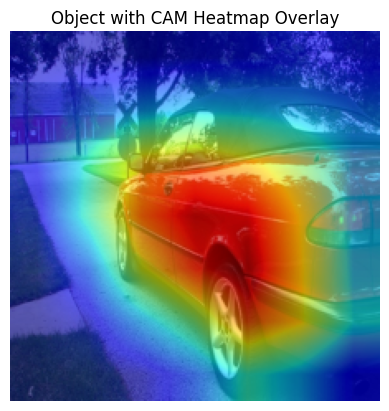

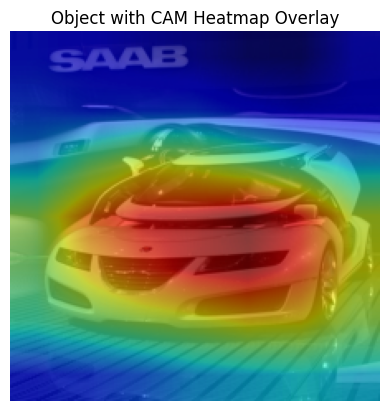

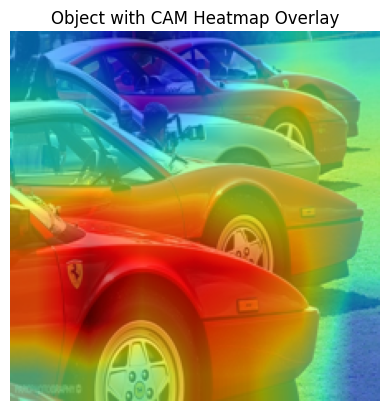

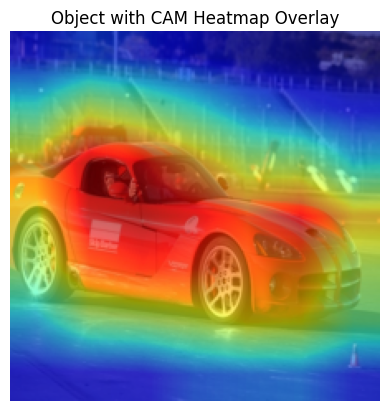

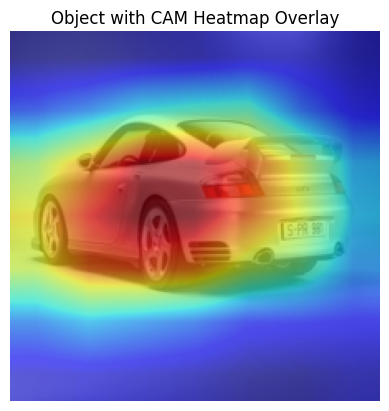

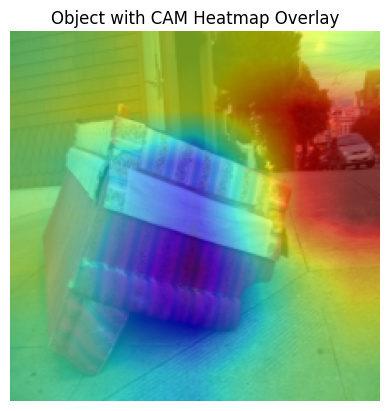

In [20]:
img_list, cam_list = CAM_output(resnetModel, correct_images)

for i in range(len(img_list)):
  plt.imshow(img_list[i])
  plt.imshow(cam_list[i], alpha=0.6, cmap='jet')
  plt.axis('off')
  plt.title('Object with CAM Heatmap Overlay')
  plt.show()

### To estimate the object center, we locate the pixel with the highest activation value using np.argmax(), which corresponds to the region the model focused on most. We mark this point with a white plus sign. While an alternative would be to compute the center of mass of the high-activation region (red region), that approach may produce misleading results in images with multiple instances of the target object.

In [21]:
plus_size = 7
white_plus_sign = [255.0, 255.0, 255.0]

def draw_plus_sign(image, plus_size=5, center_x=112, center_y=112, plus_colour=[255.0, 255.0, 255.0]):
  for t in range(-plus_size + 1, plus_size):
    if 0 <= center_y + t < 224:
      if 0 <= center_x < 224:
        image[center_y + t, center_x] = plus_colour
      if 0 <= center_x + 1 < 224:
        image[center_y + t, center_x + 1] = plus_colour
      if 0 <= center_x - 1 < 224:
        image[center_y + t, center_x - 1] = plus_colour

    if 0 <= center_x + t < 224:
      if 0 <= center_y < 224:
        image[center_y, center_x + t] = plus_colour
      if 0 <= center_y + 1 < 224:
        image[center_y + 1, center_x + t] = plus_colour
      if 0 <= center_y - 1 < 224:
        image[center_y - 1, center_x + t] = plus_colour

  return image

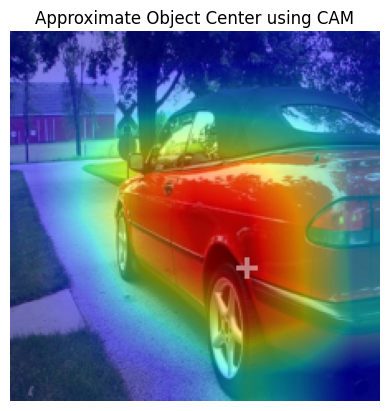

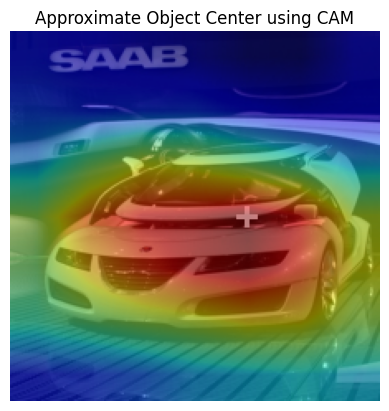

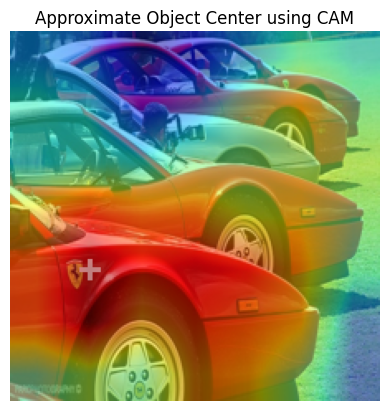

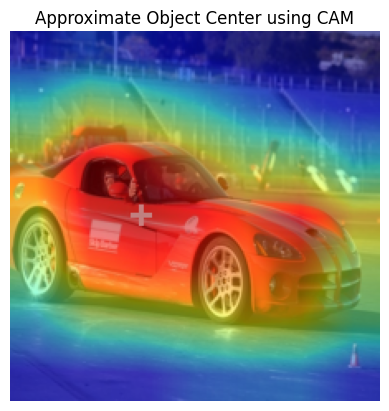

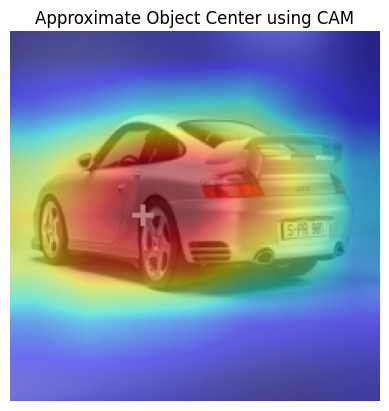

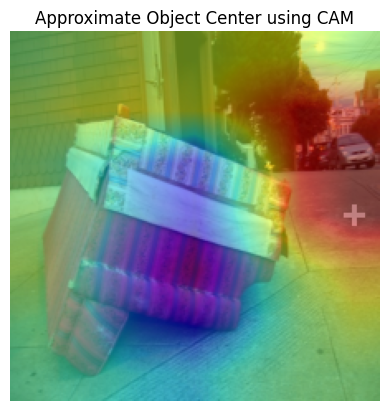

In [23]:
for i in range(len(cam_list)):
  center_y, center_x = np.unravel_index(np.argmax(cam_list[i]), cam_list[i].shape)
  new_img = draw_plus_sign(np.array(img_list[i]), plus_size, center_x, center_y, white_plus_sign)
  plt.imshow(new_img)
  plt.imshow(cam_list[i], alpha=0.5,  cmap='jet')
  plt.title("Approximate Object Center using CAM")
  plt.axis('off')
  plt.show()


### We also analyze CAMs for false positives and false negatives. In false positives, the model often fixates on features like wheels, lights, and windows from non-car vehicles as well as roads, as it likely has made the connection between seeing roads and cars. For false negatives, small cars or confusing contexts lead to poor localization and missed detections.

------------------False Positive Images------------------


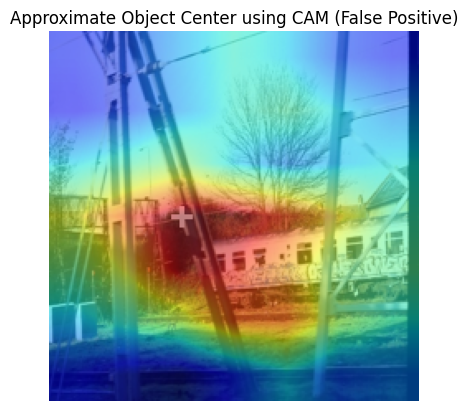

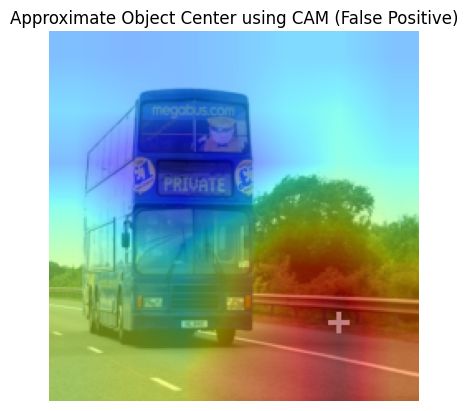

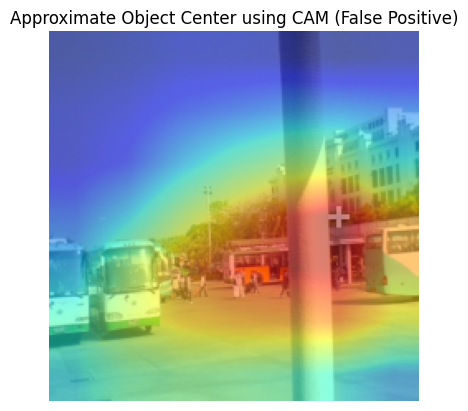


------------------False Negative Images------------------


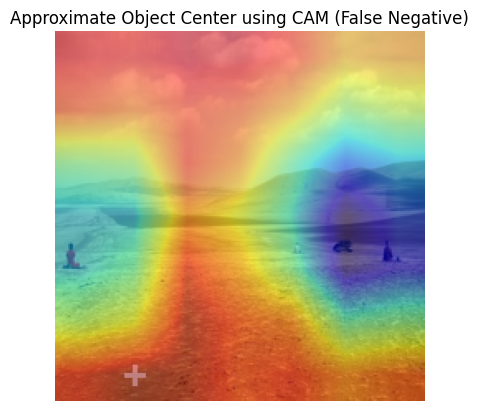

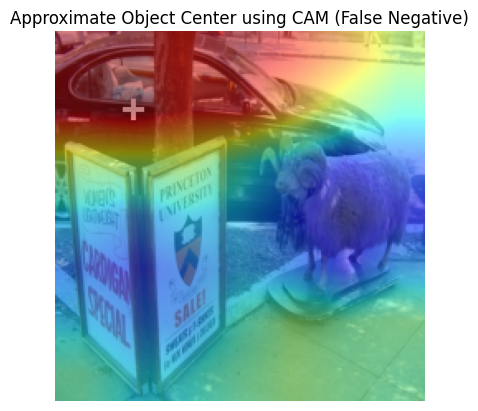

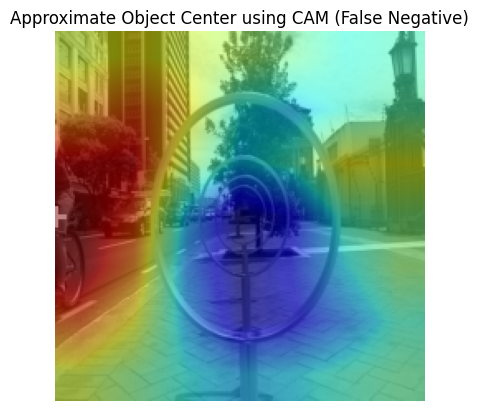

In [25]:
print("------------------False Positive Images------------------")
img_list_fp, cam_list_fp = CAM_output(resnetModel, FP_images)
img_list_fn, cam_list_fn = CAM_output(resnetModel, FN_images)

for i in range(len(cam_list_fp)):
  center_y, center_x = np.unravel_index(np.argmax(cam_list_fp[i]), cam_list[i].shape)
  new_img_fp = draw_plus_sign(np.array(img_list_fp[i]), plus_size, center_x, center_y, white_plus_sign)
  plt.imshow(new_img_fp)
  plt.imshow(cam_list_fp[i], alpha=0.5,  cmap='jet')
  plt.title("Approximate Object Center using CAM (False Positive)")
  plt.axis('off')
  plt.show()

print("")
print("------------------False Negative Images------------------")

for i in range(len(cam_list_fn)):
  center_y, center_x = np.unravel_index(np.argmax(cam_list_fn[i]), cam_list[i].shape)
  new_img_fn = draw_plus_sign(np.array(img_list_fn[i]), plus_size, center_x, center_y, white_plus_sign)
  plt.imshow(new_img_fn)
  plt.imshow(cam_list_fn[i], alpha=0.5,  cmap='jet')
  plt.title("Approximate Object Center using CAM (False Negative)")
  plt.axis('off')
  plt.show()


## **Introducing Label Noise**

### Label noise is a common challenge in real-world datasets, where incorrect labels are applied to training data, and can negatively impact model performance. Therefore, by simulating label noise, we are able to better assess the robustness of our model. To simulate this, we introduce synthetic label noise by randomly flipping a portion of the training labels based on a specified noise level. We selected a noise level of 15%, which realistically approximates the extent of noise commonly encountered in practical scenarios. Levels above 20% may begin to represent less plausible cases. Using this noisy dataset, we retrain the ResNet18 model with the same hyperparameters as the original setup. We then generate CAM heatmaps and identify object centers for a subset of validation images.

In [26]:
class NoisyDataset(Dataset):
  def __init__(self, original_dataset, noise_level):
    self.original_dataset = original_dataset
    self.noise_level = noise_level
    self.noisy_labels = []
    for _, label in original_dataset:
      random_val = random.random()
      if random_val < self.noise_level:
        self.noisy_labels.append(1 - label)
      else:
        self.noisy_labels.append(label)

  def __len__(self):
      return len(self.original_dataset)

  def __getitem__(self, idx):
      img, _ = self.original_dataset[idx]
      label = self.noisy_labels[idx]
      return img, label

In [28]:
noisy_training_set = NoisyDataset(training_set, 0.15)
noisytrainingloader = DataLoader(noisy_training_set, batch_size=current_batch_size, shuffle=True, num_workers=num_of_workers)

noisyresnetModel = models.resnet18(pretrained=True)
noisyresnetModel.fc = nn.Linear(512, 2)
noisyresnetModel.to(device)
optimizer = optim.SGD(noisyresnetModel.parameters(), lr=0.0001, momentum=0.9, weight_decay=0.01)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


-----------------------------------------------------------------------
       Epoch 1/20


100%|██████████| 79/79 [00:13<00:00,  5.89it/s]


Training Loss: 0.6230, Training Accuracy: 0.7405
Validation Loss: 0.4275, Validation Accuracy: 0.8896
-----------------------------------------------------------------------
       Epoch 2/20



100%|██████████| 79/79 [00:13<00:00,  5.97it/s]


Training Loss: 0.5790, Training Accuracy: 0.7733
Validation Loss: 0.3982, Validation Accuracy: 0.9004
-----------------------------------------------------------------------
       Epoch 3/20



100%|██████████| 79/79 [00:13<00:00,  5.84it/s]


Training Loss: 0.5630, Training Accuracy: 0.7829
Validation Loss: 0.3709, Validation Accuracy: 0.9088
-----------------------------------------------------------------------
       Epoch 4/20



100%|██████████| 79/79 [00:13<00:00,  5.88it/s]


Training Loss: 0.5581, Training Accuracy: 0.7865
Validation Loss: 0.3598, Validation Accuracy: 0.9116
-----------------------------------------------------------------------
       Epoch 5/20



100%|██████████| 79/79 [00:13<00:00,  5.92it/s]


Training Loss: 0.5436, Training Accuracy: 0.7913
Validation Loss: 0.3742, Validation Accuracy: 0.8944
-----------------------------------------------------------------------
       Epoch 6/20



100%|██████████| 79/79 [00:13<00:00,  5.92it/s]


Training Loss: 0.5406, Training Accuracy: 0.7985
Validation Loss: 0.3825, Validation Accuracy: 0.8880
-----------------------------------------------------------------------
       Epoch 7/20



100%|██████████| 79/79 [00:13<00:00,  5.86it/s]


Training Loss: 0.5430, Training Accuracy: 0.7849
Validation Loss: 0.3452, Validation Accuracy: 0.9139
-----------------------------------------------------------------------
       Epoch 8/20



100%|██████████| 79/79 [00:13<00:00,  5.92it/s]


Training Loss: 0.5319, Training Accuracy: 0.7969
Validation Loss: 0.3662, Validation Accuracy: 0.9016
-----------------------------------------------------------------------
       Epoch 9/20



100%|██████████| 79/79 [00:13<00:00,  5.87it/s]


Training Loss: 0.5316, Training Accuracy: 0.7997
Validation Loss: 0.3526, Validation Accuracy: 0.9092
-----------------------------------------------------------------------
       Epoch 10/20



100%|██████████| 79/79 [00:13<00:00,  5.93it/s]


Training Loss: 0.5187, Training Accuracy: 0.7993
Validation Loss: 0.3320, Validation Accuracy: 0.9283
-----------------------------------------------------------------------
       Epoch 11/20



100%|██████████| 79/79 [00:13<00:00,  6.00it/s]


Training Loss: 0.5133, Training Accuracy: 0.8061
Validation Loss: 0.3249, Validation Accuracy: 0.9307
-----------------------------------------------------------------------
       Epoch 12/20



100%|██████████| 79/79 [00:13<00:00,  5.96it/s]


Training Loss: 0.5209, Training Accuracy: 0.8049
Validation Loss: 0.3516, Validation Accuracy: 0.9104
-----------------------------------------------------------------------
       Epoch 13/20



100%|██████████| 79/79 [00:13<00:00,  5.94it/s]


Training Loss: 0.5133, Training Accuracy: 0.8065
Validation Loss: 0.3357, Validation Accuracy: 0.9175
-----------------------------------------------------------------------
       Epoch 14/20



100%|██████████| 79/79 [00:13<00:00,  5.70it/s]


Training Loss: 0.5089, Training Accuracy: 0.8113
Validation Loss: 0.3316, Validation Accuracy: 0.9179
-----------------------------------------------------------------------
       Epoch 15/20



100%|██████████| 79/79 [00:15<00:00,  4.98it/s]


Training Loss: 0.5041, Training Accuracy: 0.8109
Validation Loss: 0.3275, Validation Accuracy: 0.9191
-----------------------------------------------------------------------
       Epoch 16/20



100%|██████████| 79/79 [00:13<00:00,  5.92it/s]


Training Loss: 0.4970, Training Accuracy: 0.8213
Validation Loss: 0.3386, Validation Accuracy: 0.9139
-----------------------------------------------------------------------
       Epoch 17/20



100%|██████████| 79/79 [00:15<00:00,  5.19it/s]


Training Loss: 0.4999, Training Accuracy: 0.8069
Validation Loss: 0.3118, Validation Accuracy: 0.9291
-----------------------------------------------------------------------
       Epoch 18/20



100%|██████████| 79/79 [00:13<00:00,  5.90it/s]


Training Loss: 0.4970, Training Accuracy: 0.8113
Validation Loss: 0.3599, Validation Accuracy: 0.8992
-----------------------------------------------------------------------
       Epoch 19/20



100%|██████████| 79/79 [00:13<00:00,  5.91it/s]


Training Loss: 0.4924, Training Accuracy: 0.8145
Validation Loss: 0.3370, Validation Accuracy: 0.9127
-----------------------------------------------------------------------
       Epoch 20/20



100%|██████████| 79/79 [00:13<00:00,  5.92it/s]



Training Loss: 0.4904, Training Accuracy: 0.8137
Validation Loss: 0.3124, Validation Accuracy: 0.9259
-----------------------------------------------------------------------


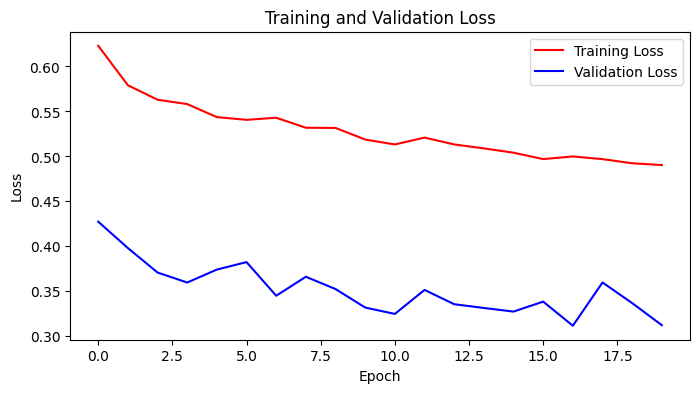

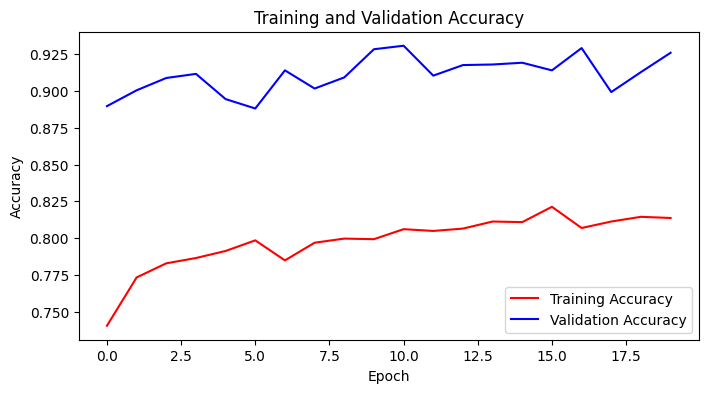

In [29]:
# Training noisy model
noisy_training_loss = []
noisy_training_accuracy = []
noisy_validation_loss = []
noisy_validation_accuracy = []
noisy_true_labels = []
noisy_predicted_labels = []
noisy_correct_images = []
noisy_FP_images = []
noisy_FN_images = []

print("-----------------------------------------------------------------------")
for epoch in range(num_epochs):
  print(f"       Epoch {epoch+1}/{num_epochs}")

  #training loop
  noisyresnetModel.train()
  noisy_current_training_loss = 0.0
  noisy_training_correct = 0
  noisy_training_total = 0
  for i, data in tqdm(enumerate(noisytrainingloader), total=len(noisytrainingloader)):
    noisy_training_total += 1
    img, labels = data
    img = img.to(device)
    labels = labels.to(device)
    optimizer.zero_grad()
    outputs = noisyresnetModel(img)
    loss = criterion(outputs, labels)
    noisy_current_training_loss += loss.item()
    _, predictions = torch.max(outputs, 1)
    noisy_training_correct += (predictions == labels).sum().item()
    loss.backward()
    optimizer.step()
  epoch_training_loss =  noisy_current_training_loss/noisy_training_total
  epoch_training_accuracy = noisy_training_correct/len(training_set)
  noisy_training_loss.append(epoch_training_loss)
  noisy_training_accuracy.append(epoch_training_accuracy)

  #validation loop
  noisyresnetModel.eval()
  noisy_current_validation_loss = 0.0
  noisy_validation_correct = 0
  noisy_validation_total = 0
  with torch.no_grad():
    for i, data in tqdm(enumerate(validationloader), total=len(validationloader)):
      noisy_validation_total += 1
      img, labels = data
      img = img.to(device)
      labels = labels.to(device)
      outputs = noisyresnetModel(img)
      loss = criterion(outputs, labels)
      noisy_current_validation_loss += loss.item()
      _, predictions = torch.max(outputs, 1)
      noisy_validation_correct += (predictions == labels).sum().item()
      if epoch == num_epochs - 1:
        noisy_true_labels.extend(labels.cpu().numpy())
        noisy_predicted_labels.extend(predictions.cpu().numpy())
        labels_len = len(labels)
        for j in range(labels_len):
          if len(noisy_correct_images) >= 6 and len(noisy_FP_images) >= 3 and len(noisy_FN_images) >= 3:
            break
          img_denormalized = denormalize(img[j].cpu(), mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
          if predictions[j] == labels[j]:
            if len(noisy_correct_images) < 6 and predictions[j] == 1:
              noisy_correct_images.append(transforms.ToPILImage()(img_denormalized.clamp(0, 1)))
          else:
            if len(noisy_FP_images) < 3 and predictions[j] == 1:
              noisy_FP_images.append(transforms.ToPILImage()(img_denormalized.clamp(0, 1)))
            elif len(noisy_FN_images) < 3 and predictions[j] == 0:
              noisy_FN_images.append(transforms.ToPILImage()(img_denormalized.clamp(0, 1)))
  epoch_validation_loss =  noisy_current_validation_loss/noisy_validation_total
  epoch_validation_accuracy = noisy_validation_correct/len(validation_set)
  noisy_validation_loss.append(epoch_validation_loss)
  noisy_validation_accuracy.append(epoch_validation_accuracy)
  print("")
  print(f"Training Loss: {epoch_training_loss:.4f}, Training Accuracy: {epoch_training_accuracy:.4f}")
  print(f"Validation Loss: {epoch_validation_loss:.4f}, Validation Accuracy: {epoch_validation_accuracy:.4f}")
  print("-----------------------------------------------------------------------")

plt.figure(figsize=(8, 4))
plt.plot(noisy_training_loss, color='red', label='Training Loss')
plt.plot(noisy_validation_loss, color='blue', label='Validation Loss')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(noisy_training_accuracy, color='red', label='Training Accuracy')
plt.plot(noisy_validation_accuracy, color='blue', label='Validation Accuracy')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.show()

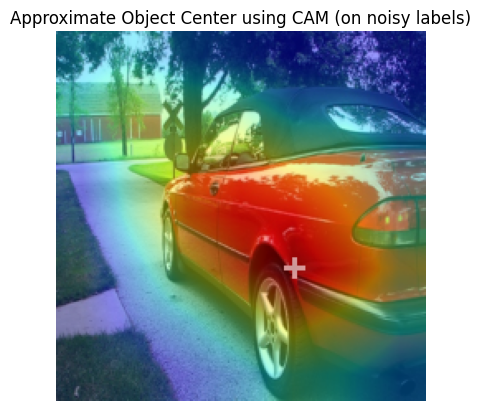

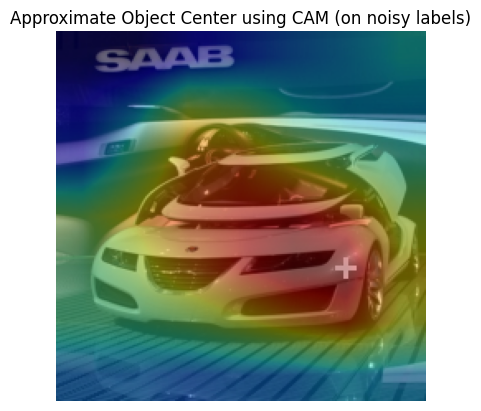

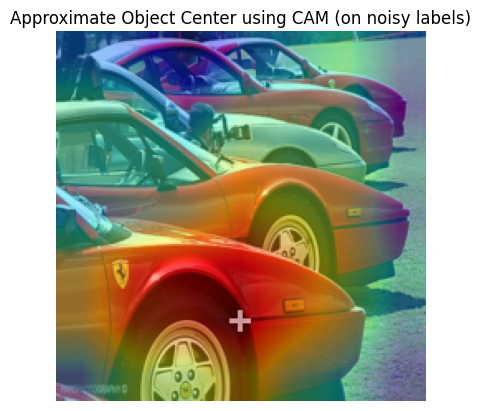

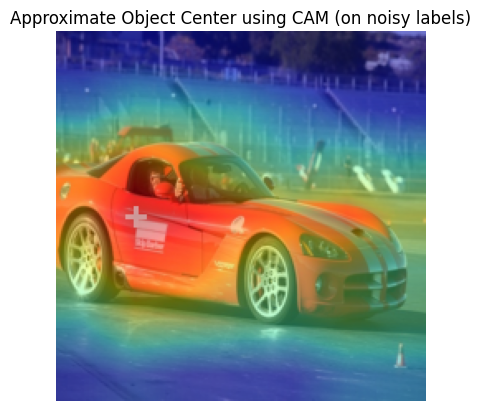

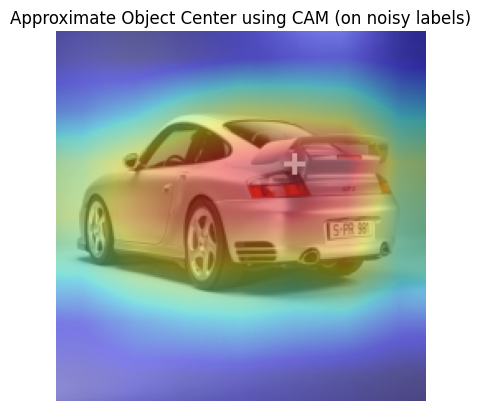

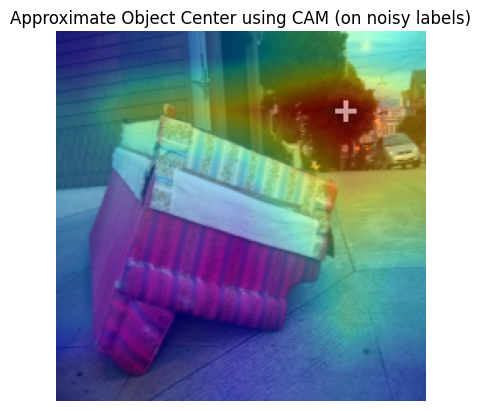

In [30]:
cam_heatmaps = []
img_list, cam_list = CAM_output(noisyresnetModel, noisy_correct_images)

for i in range(len(cam_list)):
  center_y, center_x = np.unravel_index(np.argmax(cam_list[i]), cam_list[i].shape)
  new_img = draw_plus_sign(np.array(img_list[i]), plus_size, center_x, center_y, white_plus_sign)
  plt.imshow(new_img)
  plt.imshow(cam_list[i], alpha=0.4,  cmap='jet')
  plt.title("Approximate Object Center using CAM (on noisy labels)")
  plt.axis('off')
  plt.show()

------------------False Positive Images------------------


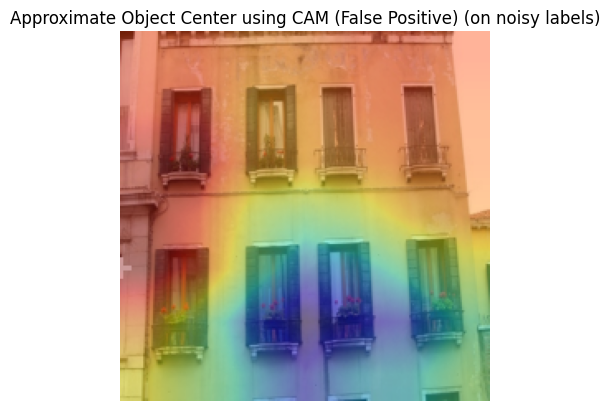

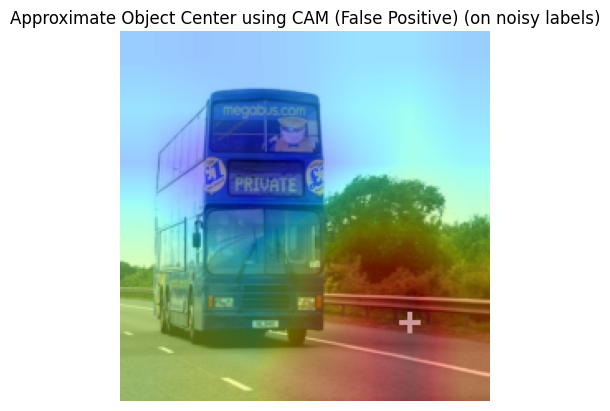

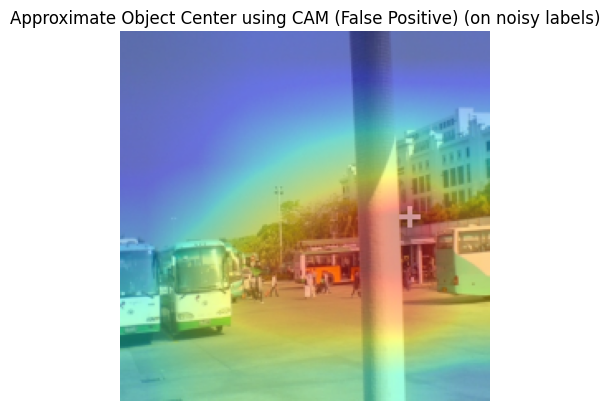


------------------False Negative Images------------------


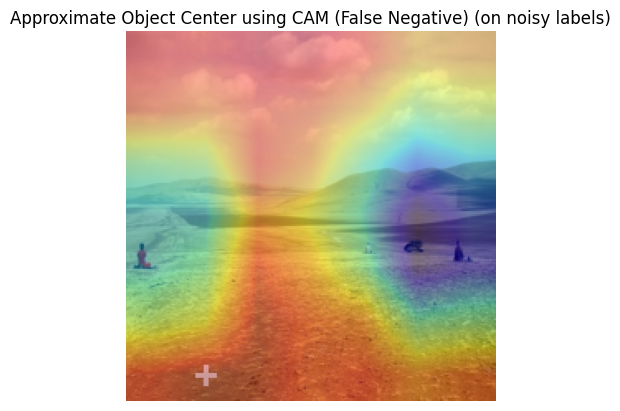

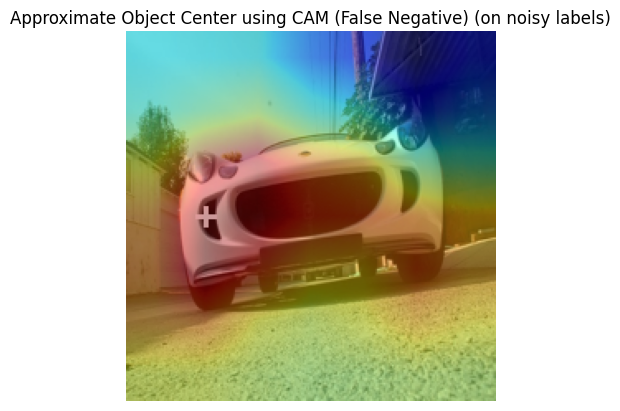

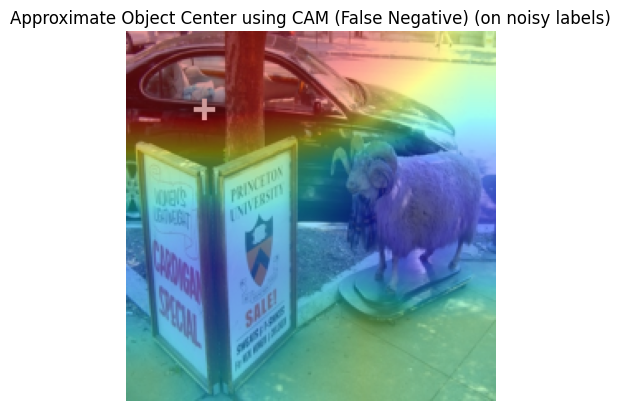

In [31]:
print("------------------False Positive Images------------------")
img_list_fp, cam_list_fp = CAM_output(resnetModel, noisy_FP_images)
img_list_fn, cam_list_fn = CAM_output(resnetModel, noisy_FN_images)

for i in range(len(cam_list_fp)):
  center_y, center_x = np.unravel_index(np.argmax(cam_list_fp[i]), cam_list[i].shape)
  new_img_fp = draw_plus_sign(np.array(img_list_fp[i]), plus_size, center_x, center_y, white_plus_sign)
  plt.imshow(new_img_fp)
  plt.imshow(cam_list_fp[i], alpha=0.4,  cmap='jet')
  plt.title("Approximate Object Center using CAM (False Positive) (on noisy labels)")
  plt.axis('off')
  plt.show()

print("")
print("------------------False Negative Images------------------")

for i in range(len(cam_list_fn)):
  center_y, center_x = np.unravel_index(np.argmax(cam_list_fn[i]), cam_list[i].shape)
  new_img_fn = draw_plus_sign(np.array(img_list_fn[i]), plus_size, center_x, center_y, white_plus_sign)
  plt.imshow(new_img_fn)
  plt.imshow(cam_list_fn[i], alpha=0.4,  cmap='jet')
  plt.title("Approximate Object Center using CAM (False Negative) (on noisy labels)")
  plt.axis('off')
  plt.show()

### With noise, validation accuracy drops slightly to 92.6%, but validation loss increases significantly to 31.2%. Training accuracy and loss metrics also show greater instability and worse performance. The CAM heatmaps reveal that the model becomes less reliable in determining object centers, especially in images where the car is viewed from the front or partially occluded.

## **Conclusion**

### In this project, we demonstrated the effectiveness of Class Activation Mapping (CAM) for localizing object presence in weakly labeled data using the Pascal VOC 2007 dataset. By training a ResNet18 model on binary image-level labels (car present vs. no car), we were able to generate CAM heatmaps that visually highlight the most discriminative image regions used by the model to identify the presence of a car. This allowed us not only to assess the model's classification performance but also to gain insight into the decision-making process of the convolutional neural network. The generated CAMs successfully localized approximate object centers in many of the correctly classified images, particularly when the object was clearly visible. Even without any bounding box supervision, the model learned to focus on semantically relevant parts of the image, such as wheels, windshields, and headlights, indicating that weak supervision can still yield meaningful spatial information.

### We further evaluated the robustness of our model by introducing label noise to simulate real-world inconsistencies in annotation quality. While the overall drop in validation accuracy was minor (from 93.8% to 92.6%), the model trained on noisy data exhibited noticeably worse training loss and produced less precise heatmaps, especially for challenging viewpoints such as frontal or occluded cars. This highlights the resilience of CNNs to moderate label noise in classification tasks, but also illustrates how noise can lead to less confident or mislocalized attention when interpreting model outputs through CAM. Overall, this experiment supports the value of using CAM for both qualitative and quantitative analysis in weakly supervised settings. Future work could explore different CAM variants like Grad-CAM, Score-CAM, or Ablation-CAM, although many of these are computationally intensive, and also more extensive studies on the impact of different types and levels of label noise on interpretability and performance.





## **References**

Dhurkesh, S. (2024, June 6). Understanding Class Activation Maps (CAM):Part 1. [https://sri-dhurkesh.github.io/posts/Understanding-Class-Activation-Maps-%28CAM%29-Part-1](https://sri-dhurkesh.github.io/posts/Understanding-Class-Activation-Maps-%28CAM%29-Part-1)

Joel Simon's denormalization code: https://www.google.com/url?q=https%3A%2F%2Fdiscuss.pytorch.org%2Ft%2Fsimple-way-to-inverse-transform-normalization%2F4821%2F3

Zhou, B., Khosla, A., Lapedriza, A., Oliva, A., & Torralba, A. (2016). Learning Deep Features for Discriminative Localization. *Conference on Computer Vision and Pattern Recognition*. https://doi.org/10.1109/cvpr.2016.319

Zhou's sample code: https://github.com/zhoubolei/CAM/blob/master